# Imports

In [ ]:
!pip install pygam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 52.7 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1


In [ ]:
# Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score,f1_score
from sklearn.model_selection import KFold,GridSearchCV
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.tree import DecisionTreeRegressor, export_graphviz, DecisionTreeClassifier
from pygam import LinearGAM, s, l, te, f
from sklearn.preprocessing import KBinsDiscretizer

In [ ]:
!pip install ucimlrepo

First of all, we have to fecth the wine_quality dataset from the UCI repository.

# Exploratory data analysis (EDA)

In [ ]:
from ucimlrepo import fetch_ucirepo
# fetch dataset
wine_quality = fetch_ucirepo(id=186)
# data (as pandas dataframes)
X = wine_quality.data.features
y = wine_quality.data.targets
# metadata
print(wine_quality.metadata)
# variable information
print(wine_quality.variables)

{'uci_id': 186, 'name': 'Wine Quality', 'repository_url': 'https://archive.ics.uci.edu/dataset/186/wine+quality', 'data_url': 'https://archive.ics.uci.edu/static/public/186/data.csv', 'abstract': 'Two datasets are included, related to red and white vinho verde wine samples, from the north of Portugal. The goal is to model wine quality based on physicochemical tests (see [Cortez et al., 2009], http://www3.dsi.uminho.pt/pcortez/wine/).', 'area': 'Business', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 4898, 'num_features': 11, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['quality'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Wed Nov 15 2023', 'dataset_doi': '10.24432/C56S3T', 'creators': ['Paulo Cortez', 'A. Cerdeira', 'F. Almeida', 'T. Matos', 'J. Reis'], 'intro_paper': {'ID': 252, 'type': 'NATIVE', 'title': 'Modeling wine preferences

As we can see in the variables, we have a target quality which will be our aim in this task, to predict wine quality with the dataset provided.
<br>
We have 11 continous features and one categorical related with the characteristics of the wine such as their acidity, alcohol, pH, ...
<br>
Indeed, there are no missing values seeing the information of the variables with `wine_quality.variables`, but also we could see the missing values with the method `isnull().values.any()`

In [ ]:
X.isnull().values.any(),y.isnull().values.any() # Another way to check whether any value is missed

(False, False)

In [ ]:
# First view of the data
X

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8


In [ ]:
y

,quality
0,5
1,5
2,5
3,6
4,5
...,...
6492,6
6493,5
6494,6
6495,7


Also, we consider important to view the statistic of the dataset because we could see extra information in advance.

In [ ]:
X.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000


We can see that the features "residual_sugar", "free_sulfur_dioxide" and "cholrides" have quite high standar deviation, this means that these features have more data dispersion. Furthermore, watching the 'min' and 'max' values in comparison to the mean, it is possible to think about outliner in our dataset, which is quite important to take into account because some regression/clasification algorithm would be sensible to outliners.

In [ ]:
# Detecting outliners from any feature

for feature in X.columns:
  wine_outliners = X.drop(X.index[
      (X[feature] > (X[feature].mean() + 2 * X[feature].std()))])

wine_outliners

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8


In sort, major instances from the dataset have outliners in some feature. If we decide to remove registers which have an outliner we will remove 6280 instances from our dataset, only remaining 217 instances without outliners.

We have considered to keep the full dataset because as we will see in the part of Clasification, the data distribution of the target is prety bad, with plenty of instances with a qualification of 5 or 6 but far less intances with other qualification.

In [ ]:
# For convenience, we will create a new dataframe with our features and target together
df_wine = X.join(y)

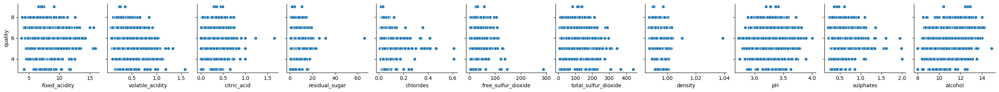

In [ ]:
sns.pairplot(df_wine, y_vars='quality', x_vars=df_wine.columns[:-1])
plt.show()

With these graphs, we can see what is required in order to achieve a better quality, for example, in 'fixed_acidity' our best qualified wines must have a fixed_acidity between 5 and 10, even we could refine our conclution because of the fact that if we see the data distribution of the highest qualities (above 8), we could suggest that values more approximated to 6 has more chances for our wine to have more quality because of data distribution.

This reasoning and analysis could be extrapolated for the rest of the features as well as we can see better outliners.

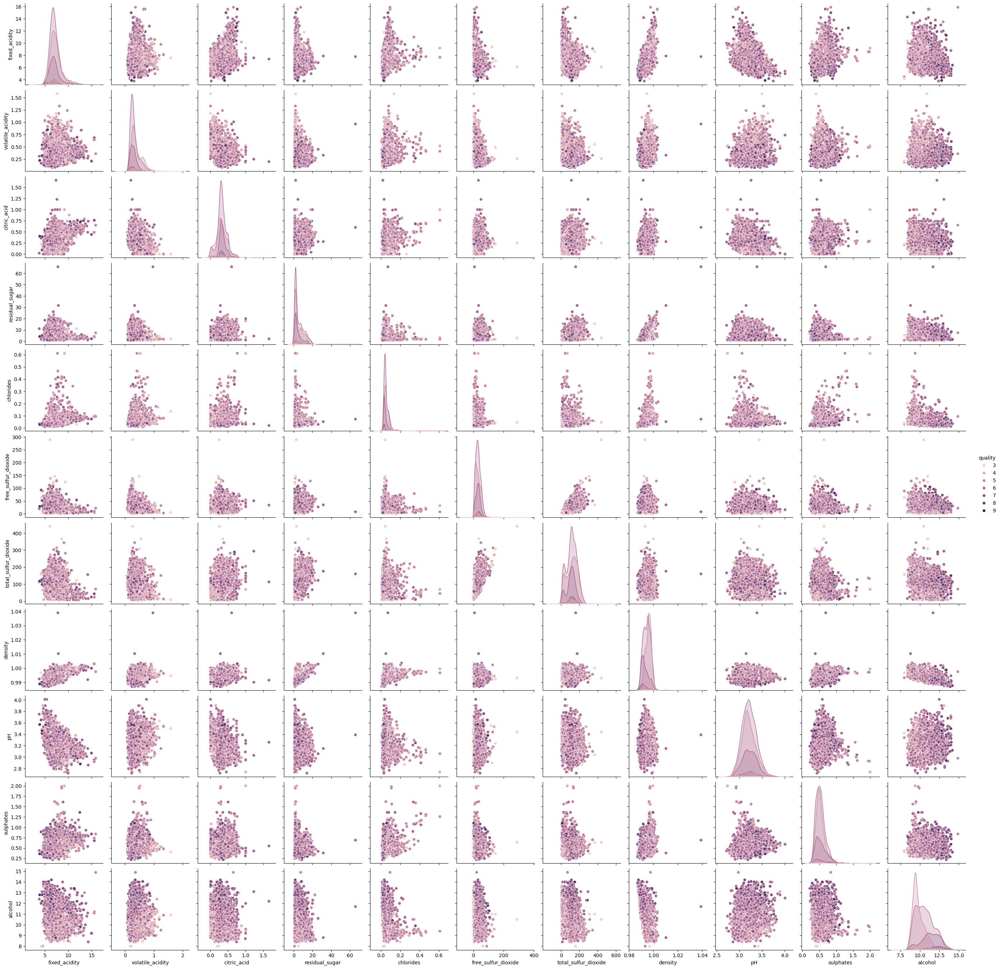

In [ ]:
import seaborn as sns
# Pairplot to visualize relationships between features and the target
sns.pairplot(df_wine, hue='quality')
plt.show()

Plotting the distribution of the target, we can see that no clear distiction is made so will be quite dificult for some clasification algorithm like knn to find the optimal number of neighbour to clasifify correctly, because we cloud see the same quality in different zones from a plot.

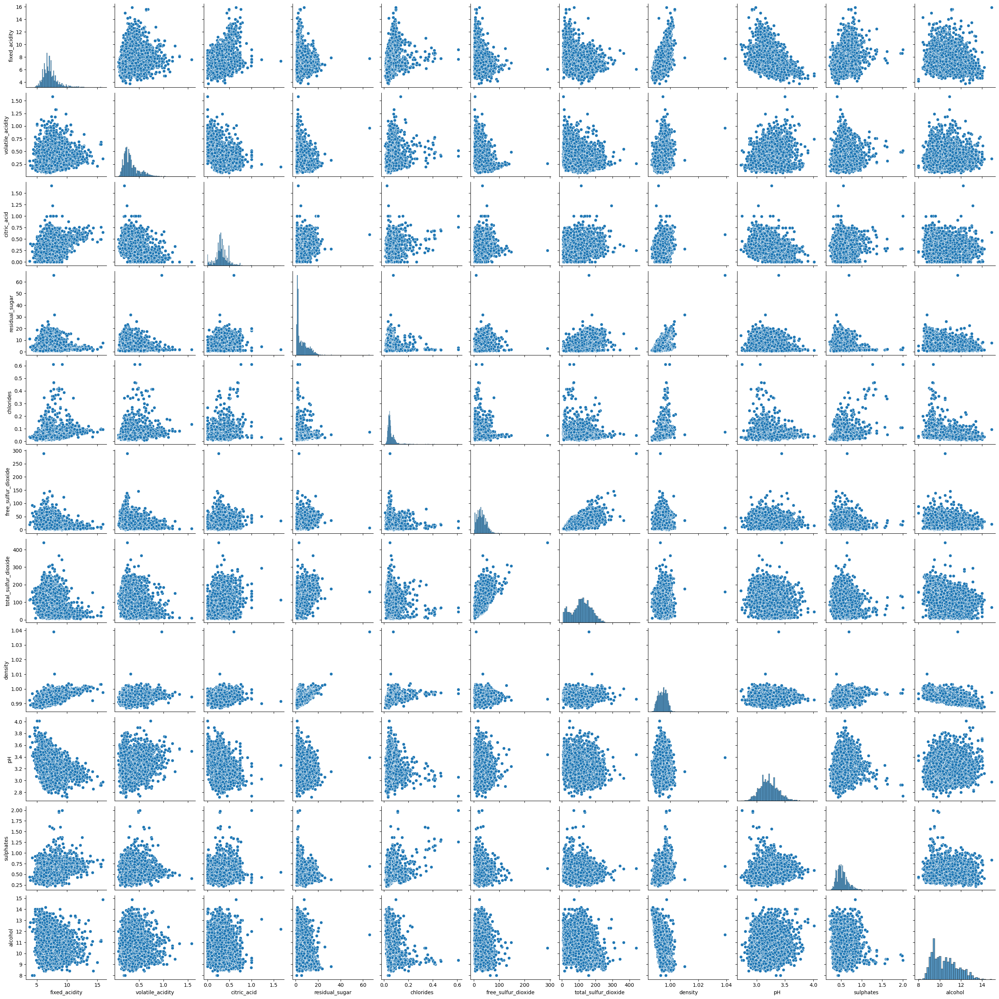

In [ ]:
# Ploting the relation of our features with eachother
features = df_wine.columns[:-1]
sns.pairplot(df_wine[features])
plt.show()

It is important to see the data distribution of our features individually for check out if they follow a normal distribution in advance, specially useful when we are working with clasification models such as Gaussian Naive Bayes that we assume a normal distribution in our features.
<br>
We would look the previous graphs to see if the targets follow a normal distribution, but it is easier to plot in a linear graph.

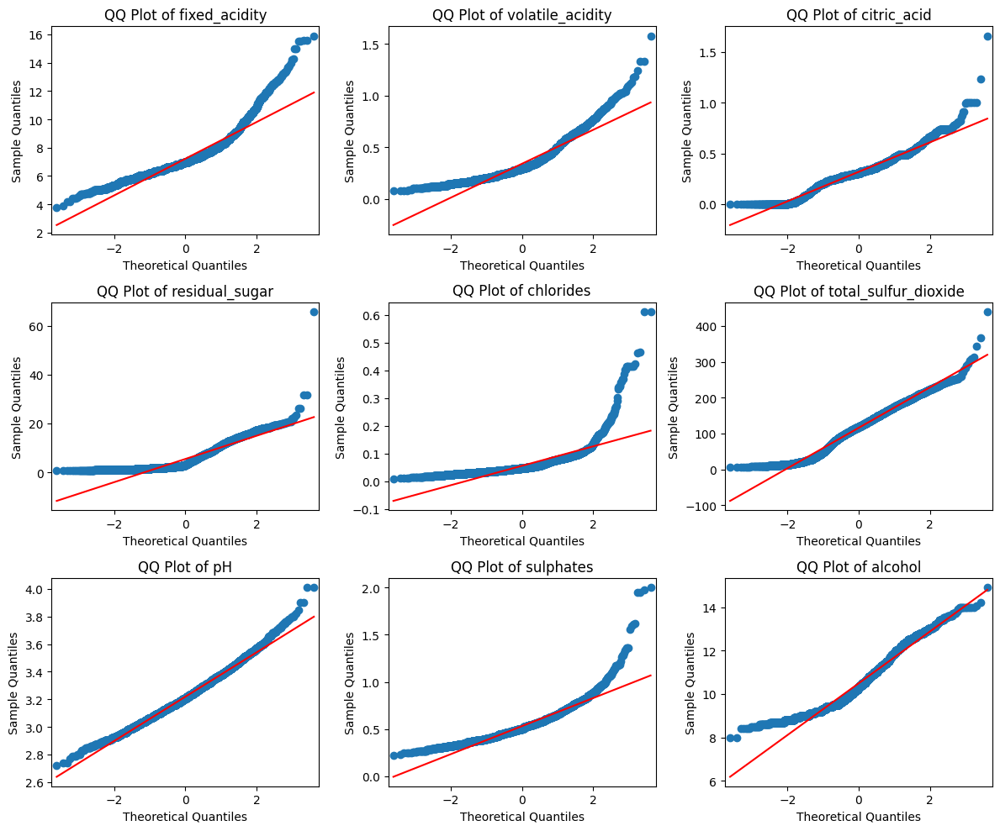

In [ ]:
import statsmodels.api as sm

# Function to generate QQ plot for each selected feature
def qq_plot(features, feature_names):
    plt.figure(figsize=(12, 10))
    for i in range(len(feature_names)):
        plt.subplot(3, 3, i + 1)
        sm.qqplot(features[feature_names[i]], line='s', ax=plt.gca())  # Use column names from the DataFrame
        plt.title(f'QQ Plot of {feature_names[i]}')
    plt.tight_layout()
    plt.show()


# Generate QQ plots for the selected continuous features
deleted_features = ['free_sulfur_dioxide','density']

selected_features = list(filter(lambda x: x not in deleted_features, features))
qq_plot(df_wine, selected_features)

As we see in these graphs, almost all features follow a perfectly normal distribution, on the one hand, features like 'pH', 'citric_acid' ,'total_sulfur_dioxide' fits perfectly with the normal distribution. On the other hand, the remaining features don't fit as accurate as the previous ones, but we could still assume a normal distribution according how strict we are.
<br>
In case of any feature in which a normal distribution don't fit, we will need to either search another distribution or transform it into a normal distribution.



Now we will study the relationship between multiple variables of the dataset. we will study the relationship between several variables in a dataset by using the functions corr and heatmap.

<Axes: >

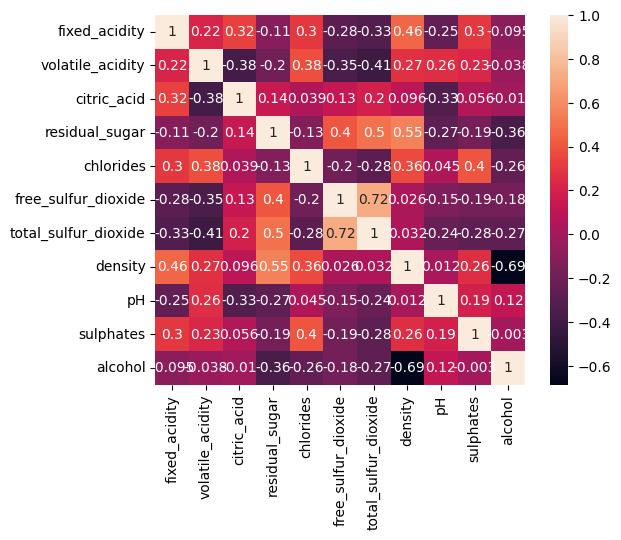

In [ ]:
corrmat = X[features].corr()
sns.heatmap(corrmat, square = True, annot=True)

As we can see, we have 2 pairs of strong corelation, which are 'free_sulfur_dioxide' with 'total_sulfur_dioxide' and 'desity' with 'alcohol' so we need to remove one of each pair, because strong relationships in our features led to worse performance, for that reason we want to have independent features to know how predictive for the outcome and identify the best coefficients.
<br>
We have decided to remove the features 'density' and 'free_sulfur_dioxide'.
We assume that strong relationships are above 0.7 (strong direct relationship) and below -0.7 (strong indirect relationship), however, we could adjust a bit this criteria in the case of -0.69 assuming a strong relationship.

In [ ]:
# Removing features
df_wine.drop(['density','free_sulfur_dioxide'], axis = 1, inplace = True)

In [ ]:
df_wine

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,total_sulfur_dioxide,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,34.0,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,67.0,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,54.0,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,60.0,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,34.0,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,92.0,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,168.0,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,111.0,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,110.0,3.34,0.38,12.8,7


# Aproach and model performance


## Regression
<br>
After doing and exploratory data analysis, we are going to select a regression algorithm in order to predict with our data the wine quality. An important thing to take into account is if all our features have importance in our model regression. To verify this, we would be possible doing a descision tree and see their importance of the features, this statement is crucial in order to select the appropiate algorithm: we could choose lasso regression or ridge regression if we want to add some sort of penalty in our data with the objetive to avoid overfitting. However, we could just do a multiple linear regression, more simple but also exposed to overfitting.
<br>
We have decided to try different algorithm to compare their performances, but we estimate beforehand that if all features have importance it is possible that choosing ridge regression would tend to have better performance in comparison to the others.

In [ ]:
# Regressor Tree
regressor = DecisionTreeRegressor(criterion='squared_error')
regressor.fit(df_wine[selected_features], df_wine['quality'])


DecisionTreeRegressor()

In [ ]:
# See the importance of the features
print ('Feature Relevances')
pd.DataFrame({'Attributes': selected_features ,
              'Feature importance': regressor.feature_importances_})

Feature Relevances


,Attributes,Feature importance
0,fixed_acidity,0.077347
1,volatile_acidity,0.134451
2,citric_acid,0.075918
3,residual_sugar,0.089879
4,chlorides,0.078287
5,total_sulfur_dioxide,0.102062
6,pH,0.087420
7,sulphates,0.093207
8,alcohol,0.261431


As we could see, all features have some importance in our model, so it is interesting to chose ridge regression rather than lasso regression.
<br>
Interpreting the importance of our features, alcohol seem to be the most important in relation to wine quality, following with volatile_acidity and total_sulfur_dioxide. This result has total sense because a right amount of alcohol, complements the wine and other features of the wine like sweetness or acidity could apprear while drinking, leading into a better quality.
<br>
Another thing to take into account is the performance metric we are going to see if the models are good or not. We have choosen **R Squared** because it is more simple to interpretate for humans in comparison to Mean Squared Error.

In [ ]:
desired_features = ['alcohol','volatile_acidity','total_sulfur_dioxide']
X = df_wine[desired_features]
y = df_wine['quality']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

[]

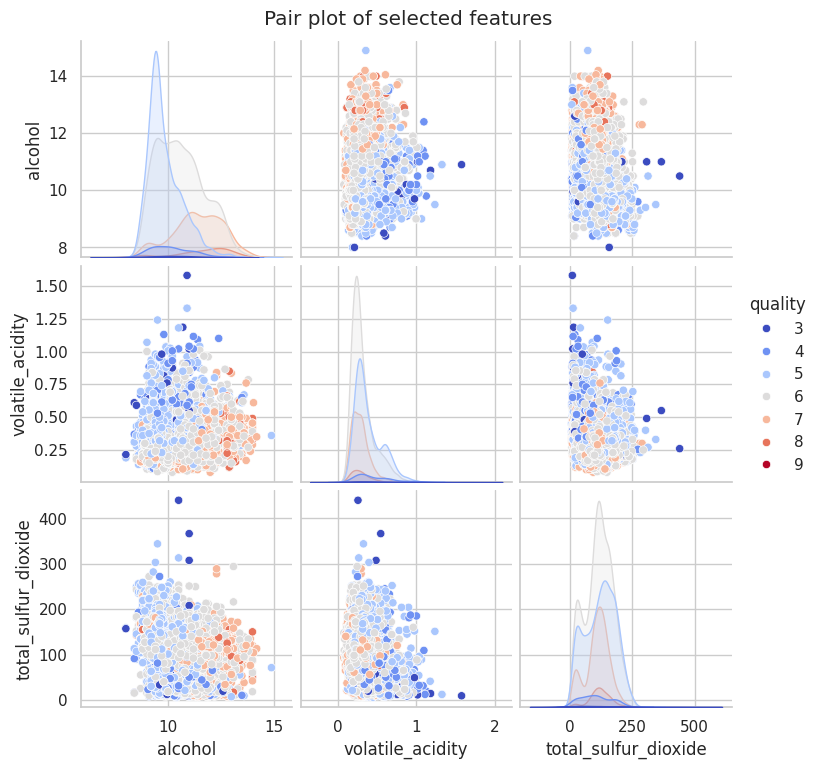

In [ ]:
# Create a pair plot with the 'target' variable
X_aux = pd.DataFrame(df_wine, columns=desired_features)
X_aux['quality'] = y
sns.pairplot(X_aux, hue='quality', diag_kind='kde', palette='coolwarm')
plt.suptitle('Pair plot of selected features', y=1.02)
plt.plot()


As we can see, with the selected features, we can see a diference between those instances who have better quality and worse quality. If we see the relation ship 'alcohol' and 'volatile_acidity', better qualities tend to be in the lower-right side of the plot, whereas lower qualities tend to be in the upper-left side.

In [ ]:
# Multilinear Regression
multi_linear_model = LinearRegression()
multi_linear_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Predictions
y_pred_train = multi_linear_model.predict(X_train)
y_pred_test = multi_linear_model.predict(X_test)
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
cv = 15

print(f"Train MSE (Multiple): {train_mse}")
print(f"Test MSE (Multiple): {test_mse}")
print(f"Train R^2 (Multiple): {train_r2}")
print(f"Test R^2 (Multiple): {test_r2}")

cv_mse = cross_val_score(multi_linear_model, X, y, cv=cv, scoring='neg_mean_squared_error')
cv_r2 = cross_val_score(multi_linear_model, X, y, cv=cv, scoring='r2')

mean_cv_mse = -np.mean(cv_mse)
mean_cv_r2 = np.mean(cv_r2)

print(f"Cross-Validated MSE (Multiple Linear Regression): {mean_cv_mse}")
print(f"Cross-Validated R² (Multiple Linear Regression): {mean_cv_r2}")

Train MSE (Multiple): 0.5663734722361199
Test MSE (Multiple): 0.5534841846836792
Train R^2 (Multiple): 0.2628836011059359
Test R^2 (Multiple): 0.25057663850051126
Cross-Validated MSE (Multiple Linear Regression): 0.5673601436285926
Cross-Validated R² (Multiple Linear Regression): 0.22622084416135924


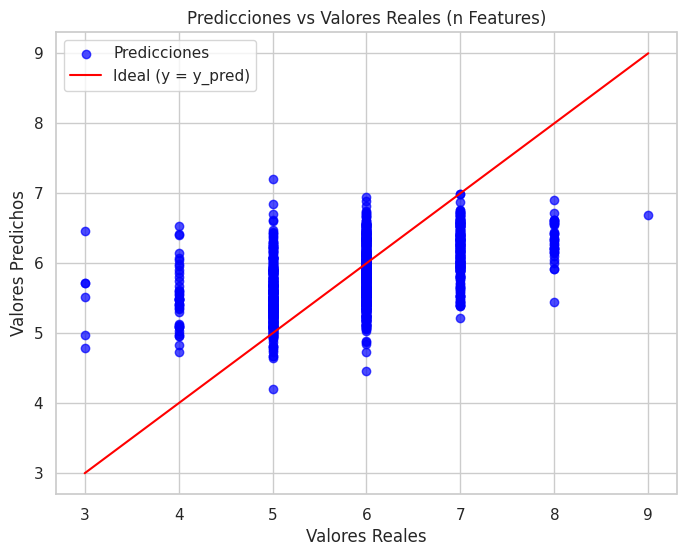

In [ ]:
# Visualización
plt.figure(figsize=(8, 6))
plt.scatter(X, y, color='blue', label="Datos Reales")
plt.plot(X, y_pred_test, color='red', label="Línea de Regresión")
plt.xlabel("Característica X")
plt.ylabel("Variable Objetivo Y")
plt.title("Regresión Lineal para Una Característica")
plt.legend()
plt.show()

As we can see, due to class imbalance mostly, minor labels like 3,4,8 9 doesn't have any prediction made correctly as well as the number of these classes are quite low in comparison to the rest. Furthermore, the lineal regression model have bad performance. We thought that the main reason of that is the class imbalance this dataset has, because as we have more instances for few labels like 5 and 6, models tend to predict these labels instead of the real ones.

### Lasso Regression

In [ ]:
# Regression with Lasso
lasso_cv = LassoCV(cv=10, random_state=42)

lasso_cv.fit(X_train, y_train)

best_lambda = lasso_cv.alpha_
print(f"Best lambda selected by LassoCV: {best_lambda}")

y_train_pred = lasso_cv.predict(X_train)
y_test_pred = lasso_cv.predict(X_test)

train_mse_lasso = mean_squared_error(y_train, y_train_pred)
test_mse_lasso = mean_squared_error(y_test, y_test_pred)
train_r2_lasso = r2_score(y_train, y_train_pred)
test_r2_lasso = r2_score(y_test, y_test_pred)

print(f"Train MSE (Lasso): {train_mse_lasso}")
print(f"Test MSE (Lasso): {test_mse_lasso}")
print(f"Train R² (Lasso): {train_r2_lasso}")
print(f"Test R² (Lasso): {test_r2_lasso}")

cv_mse = cross_val_score(lasso_cv, X, y, cv=cv, scoring='neg_mean_squared_error')
cv_r2 = cross_val_score(lasso_cv, X, y, cv=cv, scoring='r2')

mean_cv_mse = -np.mean(cv_mse)
mean_cv_r2 = np.mean(cv_r2)

print(f"Cross-Validated MSE (Lasso Regression): {mean_cv_mse}")
print(f"Cross-Validated R² (Lasso Regression): {mean_cv_r2}")

Best lambda selected by LassoCV: 0.002439540077461396
Train MSE (Lasso): 0.5666469866874381
Test MSE (Lasso): 0.5533316549533099
Train R² (Lasso): 0.26252763106622845
Test R² (Lasso): 0.25078316534703227
Cross-Validated MSE (Lasso Regression): 0.5672098404889288
Cross-Validated R² (Lasso Regression): 0.22667961834466874


### Alternative way to feature selection

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import Ridge

# This is another way to choose those features which have more importance
# for our model

ridge_cv = Ridge()
rfe = RFE(estimator=ridge_cv, n_features_to_select=10)
rfe.fit(X_train, y_train)

selected_features = X.columns[rfe.support_]
print(f"Selected features by RFE: {selected_features}")

X_rfe = df_wine[selected_features]
y_rfe = df_wine['quality']
X_train_rfe, X_test_rfe, y_train_rfe, y_test_rfe = train_test_split(X_rfe, y_rfe, test_size=0.2, random_state=42)

Selected features by RFE: Index(['alcohol', 'volatile_acidity', 'total_sulfur_dioxide'], dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/feature_selection/_rfe.py:291: UserWarning: Found n_features_to_select=10 > n_features=3. There will be no feature selection and all features will be kept.
  warnings.warn(


As we can see in the output, the selected features by rfe are the same as we had choosen before.

### Ridge Regression

In [ ]:
# Ridge Regression
ridge_cv = RidgeCV(cv=10)
ridge_cv.fit(X_train_rfe, y_train_rfe)
best_lambda = ridge_cv.alpha_
print(f"Mejor lambda seleccionado por RidgeCV: {best_lambda}")

y_train_pred = ridge_cv.predict(X_train_rfe)
y_test_pred = ridge_cv.predict(X_test_rfe)

train_mse_ridge = mean_squared_error(y_train_rfe, y_train_pred)
test_mse_ridge = mean_squared_error(y_test_rfe, y_test_pred)
train_r2_ridge = r2_score(y_train_rfe, y_train_pred)
test_r2_ridge = r2_score(y_test_rfe, y_test_pred)

print(f"Train MSE (Ridge): {train_mse_ridge}")
print(f"Test MSE (Ridge): {test_mse_ridge}")
print(f"Train R² (Ridge): {train_r2_ridge}")
print(f"Test R² (Ridge): {test_r2_ridge}")

cv_mse = cross_val_score(ridge_cv, X_rfe, y_rfe, cv=cv, scoring='neg_mean_squared_error')
cv_r2 = cross_val_score(ridge_cv, X_rfe, y_rfe, cv=cv, scoring='r2')

mean_cv_mse = -np.mean(cv_mse)
mean_cv_r2 = np.mean(cv_r2)

print(f"Cross-Validated MSE (Ridge Regression): {mean_cv_mse}")
print(f"Cross-Validated R² (Ridge Regression): {mean_cv_r2}")

Mejor lambda seleccionado por RidgeCV: 1.0
Train MSE (Ridge): 0.5663769192165127
Test MSE (Ridge): 0.5534444850485242
Train R² (Ridge): 0.26287911497461314
Test R² (Ridge): 0.2506303922207648
Cross-Validated MSE (Ridge Regression): 0.5672959701882069
Cross-Validated R² (Ridge Regression): 0.2264873937370299


### Decission Tree

In [ ]:
# Decission Tree
# Define the regression tree model
tree_model = DecisionTreeRegressor()

# Set up the parameter grid
param_grid = {
    'max_depth': list(range(2, 31)),  # Max depth from 2 to 30
    'min_samples_split': [2, 10, 20, 30, 40],  # Minimum number of samples required to split a node
}

# Set up the GridSearchCV with cross-validation and mean squared error as the scoring metric
grid_search = GridSearchCV(estimator=tree_model,
                           param_grid=param_grid,
                           scoring='r2',
                           cv=15,  # 15-fold cross-validation
                           n_jobs=-1,  # Use all cores
                           verbose=1)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

Fitting 15 folds for each of 145 candidates, totalling 2175 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=15, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                       14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                       24, 25, 26, 27, 28, 29, 30],
                         'min_samples_split': [2, 10, 20, 30, 40]},
             scoring='r2', verbose=1)

In [ ]:
# Get the best parameters and the corresponding MSE
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
best_r2 = grid_search.best_score_  # Negate the score to get the MSE

print(f"Best Parameters: {best_params}")
print(f"Best r2 score: {best_r2}")

Best Parameters: {'max_depth': 6, 'min_samples_split': 40}
Best r2 score: 0.2813331372489187


### GAM

In [ ]:
# GAM
gam = LinearGAM(s(0) + l(1) + l(2)).fit(X_train, y_train)

y_pred_train_gam = gam.predict(X_train)
y_pred_test_gam = gam.predict(X_test)

train_mse_gam = mean_squared_error(y_train, y_pred_train_gam)
test_mse_gam = mean_squared_error(y_test, y_pred_test_gam)
train_r2_gam = r2_score(y_train, y_pred_train_gam)
test_r2_gam = r2_score(y_test, y_pred_test_gam)

print(f"Train MSE (GAM): {train_mse_gam}")
print(f"Test MSE (GAM): {test_mse_gam}")
print(f"Train R^2 (GAM): {train_r2_gam}")
print(f"Test R^2 (GAM): {test_r2_gam}")

Train MSE (GAM): 0.555831602750496
Test MSE (GAM): 0.5483852990390384
Train R^2 (GAM): 0.27660349664089967
Test R^2 (GAM): 0.2574805828686634


<Figure size 640x480 with 0 Axes>

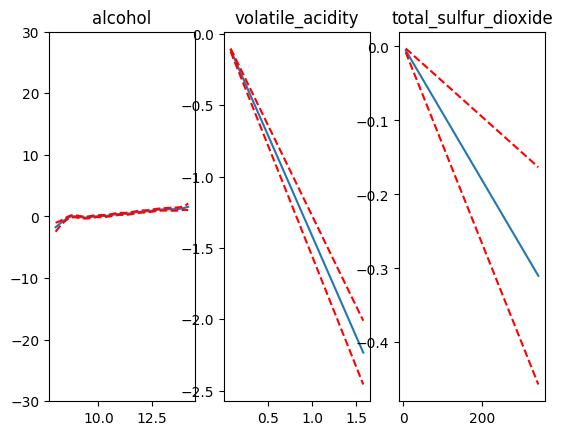

In [ ]:
plt.figure();
fig, axs = plt.subplots(1,3);

titles = selected_features
for i, ax in enumerate(axs):
    XX = gam.generate_X_grid(term=i)
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX))
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX, width=.95)[1], c='r', ls='--')
    if i == 0:
        ax.set_ylim(-30,30)
    ax.set_title(titles[i]);

In comparison to just adding spline terms or lineal terms, we have achieved the best perfomance possible with a mix of both (0.2574805828686634)
<br>
performance achieved with spline terms: 0.2474892537508988
<br>
performance achieved with lineal terms: 0.2506102743152694
<br>

In conclusion, a good performance is not achieved, this is true because the nature of the target, which is an integer. Regression algorithms would be not so suiteable for our dataset because we can interpretate the quality of wine as a class, assuming that in a classification problem we would achieve more performance.
Also we have decided not to transform the target data type because we think that it won't represent properly the target if we transform it into a continous target.
<br>
There is a table to resume the performance of the regression algorithms used:
<br>

| Algorithm | Performance (r_square) |
|--------|-----|
| Multiple Linear Regression  |0.22622084416135924|
| Lasso Regression |0.22667961834466874|
| Ridge Regression|0.2264873937370299|
|Decission Tree|**0.2813331372489187**|
|GAM|0.2574805828686634|

<br>

Comparing their performances, if we have to choose a regression algorithm we would tend to choose Decission Trees which has the best performance, regardless of how bad the performance is.



### Conclusion

Overall, we haven't seen good performances at all, this is due to the class imbalance as the main factor. However, in order to achieve better performance we can do some sort of reasoning:
- we can explore several strategies: addressing the class imbalance through techniques like oversampling or undersampling, incorporating additional or more relevant features, and leveraging non-linear models or ensemble methods that can better capture the complexity of the relationships in the data. Additionally, hyperparameter tuning and reducing noise in the dataset could further improve model generalization and predictive accuracy.




##Clasification

Before training our clasification models to search which algorithm would be better for our data, we have to discretize our features to correspond into a clasification problem.
<br>
As we see before, we are going to work which those features who has bigger importance, so we just distcretize the features 'alcohol', 'volatile_acidity' and 'total_sulfure_dioxide'.
<br>

### Discretize features

In [ ]:
# Discretization of the features
X_classi = X.copy() # Create a copy for better management
y_classi = y.copy()

enc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')
X_classi['alcohol'] = enc.fit_transform(X_classi[['alcohol']])
X_classi['volatile_acidity'] = enc.fit_transform(X_classi[['volatile_acidity']])
X_classi['total_sulfur_dioxide'] = enc.fit_transform(X_classi[['total_sulfur_dioxide']])

X_classi[['alcohol','volatile_acidity','total_sulfur_dioxide']]

,alcohol,volatile_acidity,total_sulfur_dioxide
0,0.0,2.0,0.0
1,1.0,2.0,0.0
2,1.0,2.0,0.0
3,1.0,1.0,0.0
4,0.0,2.0,0.0
...,...,...,...
6492,2.0,0.0,0.0
6493,0.0,1.0,2.0
6494,0.0,0.0,1.0
6495,2.0,1.0,1.0


Also, it is important in clasification problems the balance in our classes to see if there are good represented with our dataset.

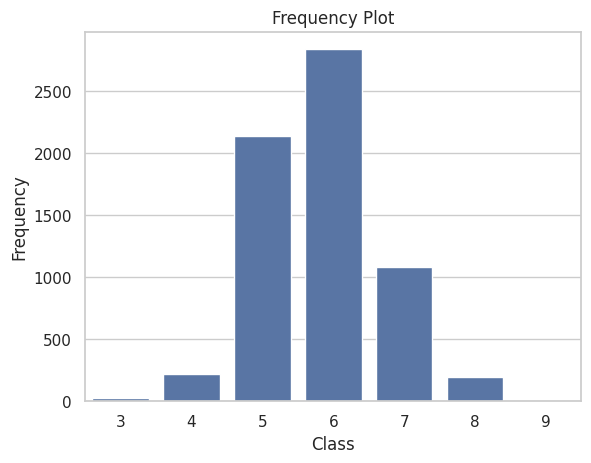

In [ ]:
# Set the style of the visualization
sns.set(style="whitegrid")

# Create a count plot
ax = sns.countplot(x='quality', data=df_wine)

# Set the title and labels of the plot
ax.set_title('Frequency Plot')
ax.set_xlabel('Class')
ax.set_ylabel('Frequency')

# Show the plot
plt.show()

We can see that class 5 and 6 are the most often in frequency, so this means that the dataset isn't balanced perfecly because the quite little intances in which the features of the wine is 3 or 9 for example. For instance, it could be harder for our model to predict correctly quite good and quite bad quality, while easier with normal qualities.
<br>
Ideally, we want the same number of instances/registers for all our classes in order to have a good model capable of predict any sort of wine quality.

If we want to reduce the importance of having disbalanced classes, we have decided to group the initial classes into **3 groups** with the intention of achieve a better performance, because with highly disbalanced classes, performance tends to decrease and predict most common classes regardless of the actual class label. As we can see in the actual data distribution, we think that this approach would be justified because of the low number of instances in classes 3,4,8 and 9 in comparison to 5,6 and 7.  

<br>

For choosing an appropiated classification algorithm, me must take into account how the data is distributed or if the classes are balanced or not in order to select the model with the best performance.
<br>
We have various options such as:<br>
- **Multinomial Naive Bayes**
- **Gaussian Naive Bayes**: we need to asume that data features have continous values and follow a normal distribution (which is our case, our features follow a normal distribution so performance should not be reduced).
- **Complement Naive Bayes**: is an adaptation of Multinomial Naive Bayes algorithm which fits better with imbalance data sets (which is our case, there are plenty of wines classificated with a quality of 6 or 5 while other qualitys like 3 and 9 are almost none of them).
- **Decission Trees**: as we can use decission trees for regression problems, we can use them for classification problems as well.
- **Knn**: a lazy learner which doesn't need a fitting process, just the dataset. The principal incovenient is to select the optimal number of neighbours, which it isn't trivial and a hard task indeed.
- **Random Forest**: we will try if with essambles we achieve a better performance in comparison to the rest, specially compared to decission trees which has the same structure in order to predict.

Taking into account these suggested models, we will choose the model with the best performance.
It is important to remind that our features are those with more importance. As we have seen, using all features aviable for our model tend to overfit, reducing our performance. For almost all models exluding Gaussian Naive Bayes, we need to discretized our features to transform it into categorical values, whereas in Gaussian Naive Bayes, like we have said before, we need our data as continous.
<br>

For this problem, we have decided to use **mlflow** in order to compare easily our models, we will discuss the performance of our models by using screenshots as well as we will provide the source code in our github.

Source: https://github.com/AlejandroCB-23/Machine_Learning_Lab/blob/main/task1/example_clasification.py

<br>

After saying that, we will show our performance metrics to see the model with the highest performance.
<br>


### Performance without discretization of the target

<br>

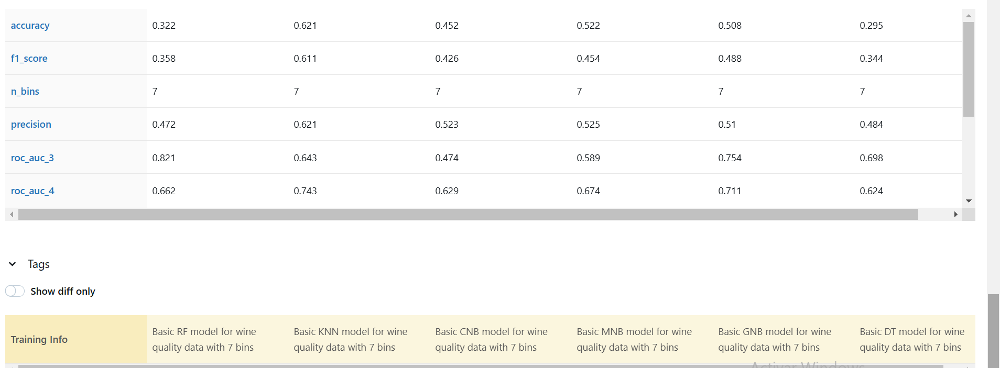

<br>


As we can see, the best model is the knn being the only model to achiever more than 0.5 in the f1_score. The remaining models are quite bad because no one have more than 0.5 in the f1_score.
<br>


#### Confusion matrix

<br>

| <!-- -->      | <!-- -->        |
|:-------------:|:---------------:|
| 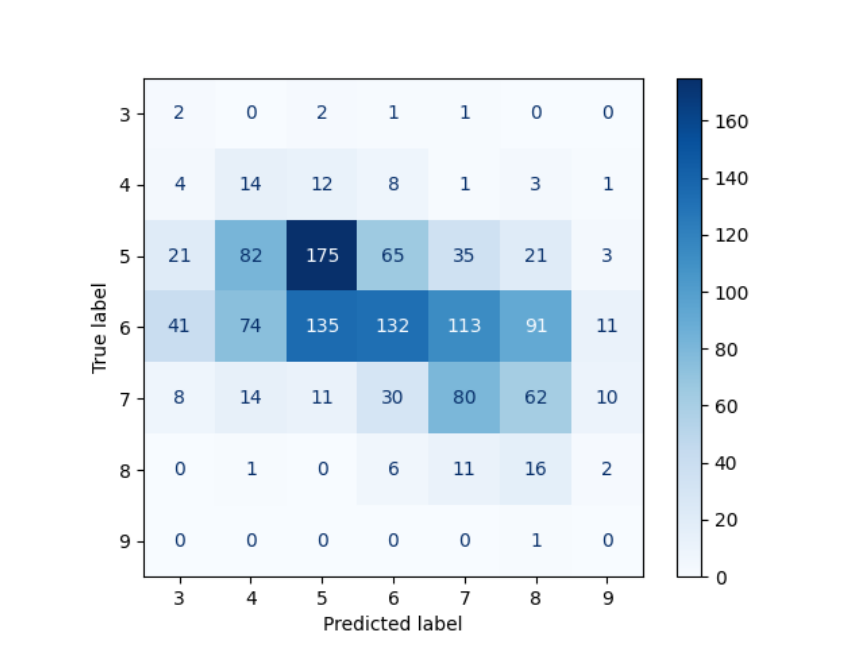<br>RF         | 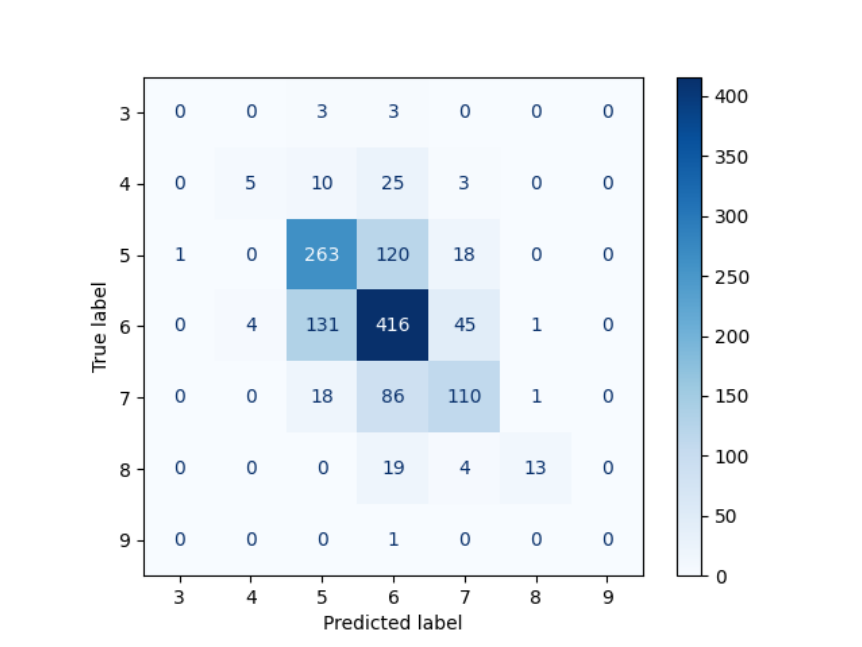<br>KNN        |
| 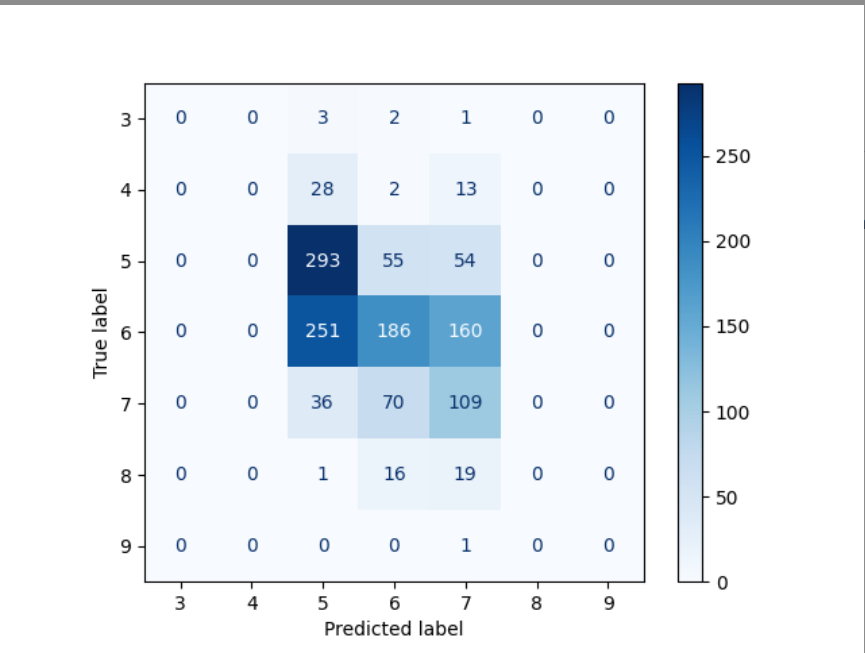<br>CNB         | 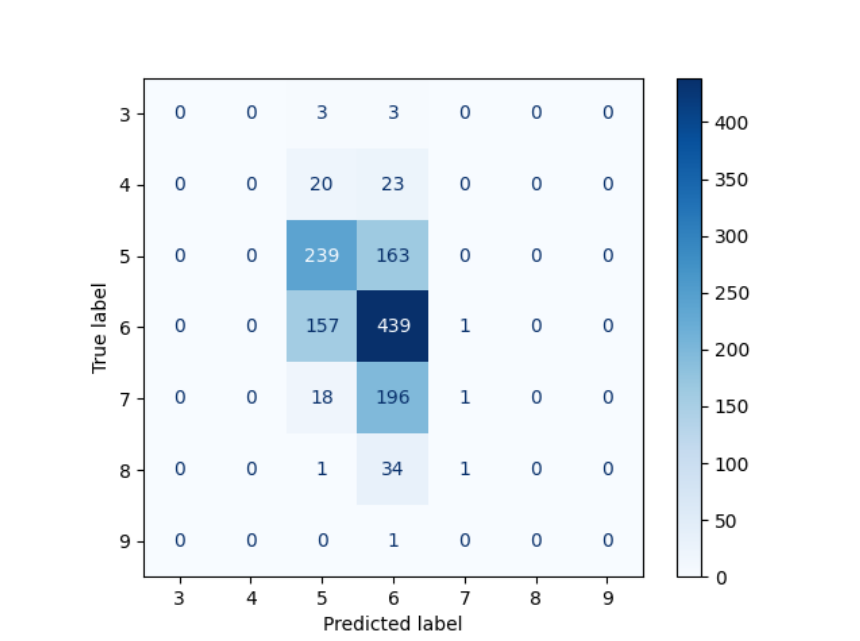<br>MNB        |
| 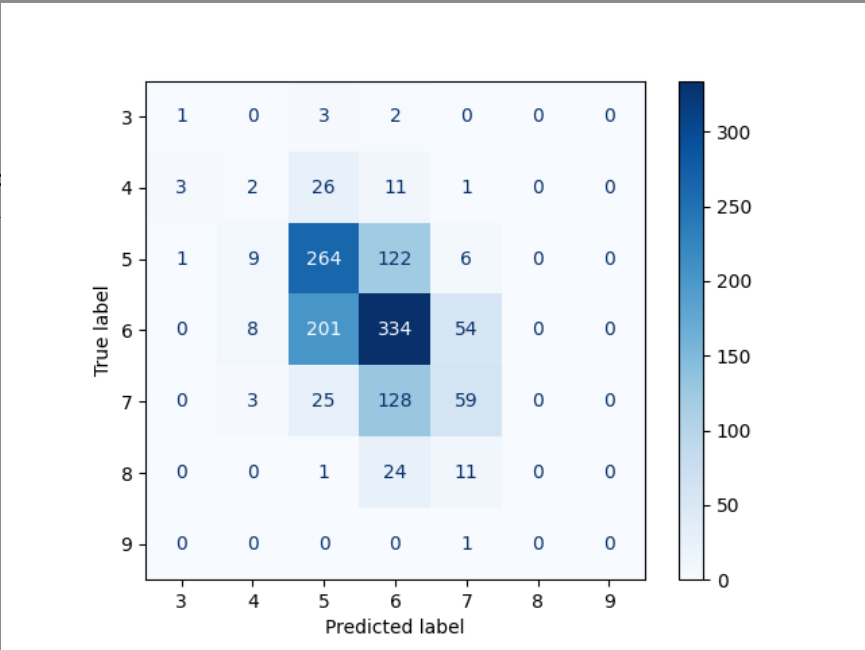<br>GNB         | 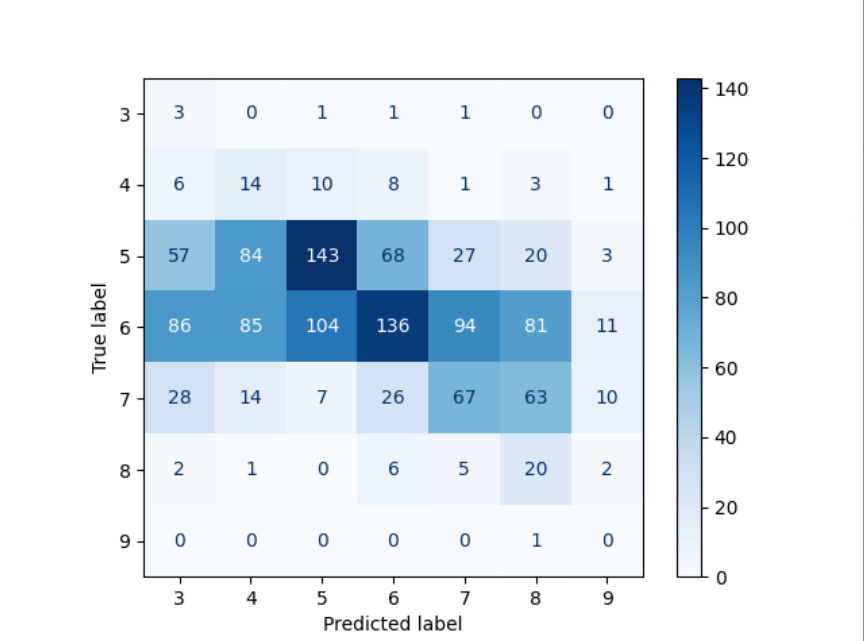<br>DT      |


As we can see in the confusion matrix, the knn is pretty good at predicting the labels 5 and 6, which are the most common ones (see the data distribution of the target), but fairly bad with the remaining ones.
<br>
Checking the remaining matrixes, we see that the most predicted label correctly is 5 and 6 which are proven to have more registers with these label (see the classes distribution before mentioned). Also seeing the matrixes, we can observe that if an label is wrongly predicted, the model tend to estimate those classes with more frecuency in our data set. For example, take a look the **true label 4** in our **GNB model**.
<br>
The model had predicted correctly when the true label was 4 only twice, however, it had been predicting wrongly in the rest of instances, being 5 (26 occurences) and 6 (11 occurences) the most commonly mistakes made by the model. We can infer the same conlustions with the remaining models. We think that this happend because of how the classes are distributed, as being 5 and 6 the most common classes, our models tend to predict these clases instead of the real ones sometimes.

Something interesting in relation to Decission Trees and Random Forest is that are better at predicting low-occurence labels (such as 3,4 or 8) in comparison with the other models, but quite bad at predicting high-occurence labels (such 5,6 and 7). As we can see, the range of prediction is fairly wide, this is because of how the tree structure was made, it is possible that less common classes have distinguished characteristics so is easier for the model to predict regardless of the number of instances for that class. On the other side, it is possible that most common classes tend the have similar characteristics so in sort, is harder for the model to predict correctly, leading into a wider range of wrong predictions.

#### ROC Curve
<br>

| <!-- -->      | <!-- -->        |
|:-------------:|:---------------:|
| 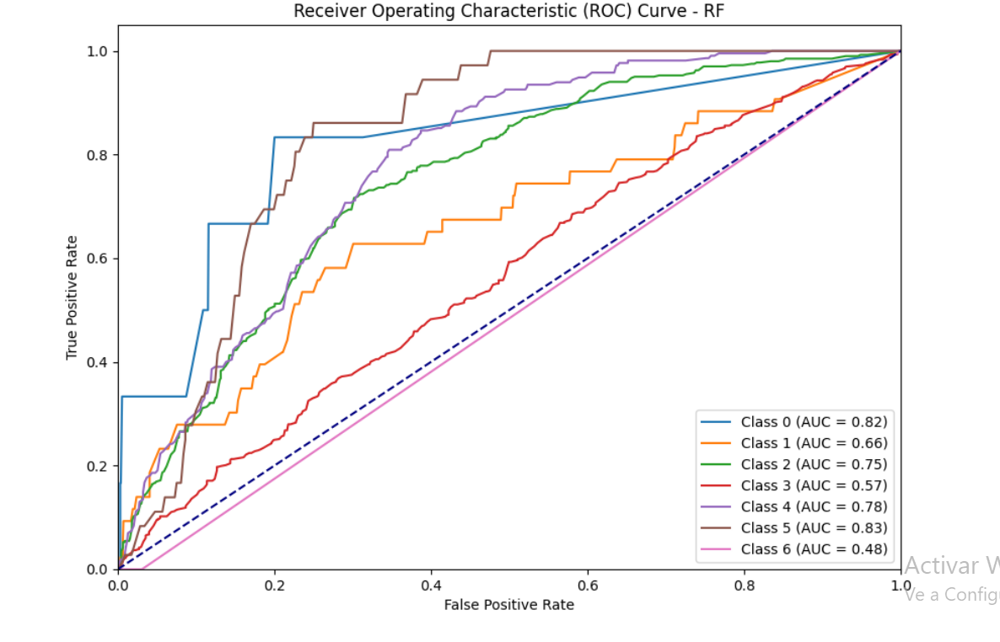<br>RF         | 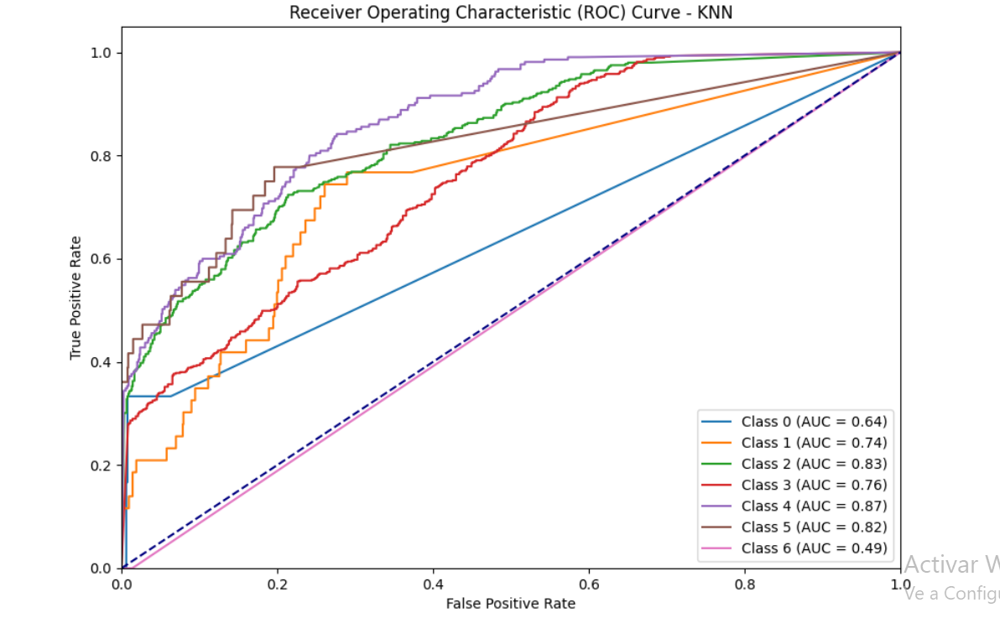<br>KNN        |
| 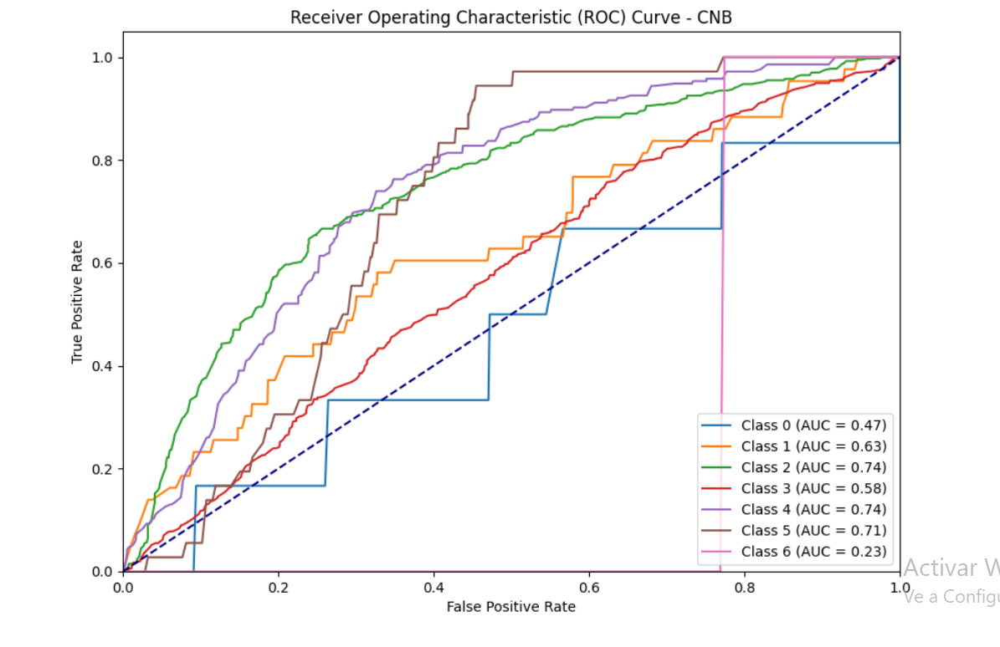<br>CNB         | 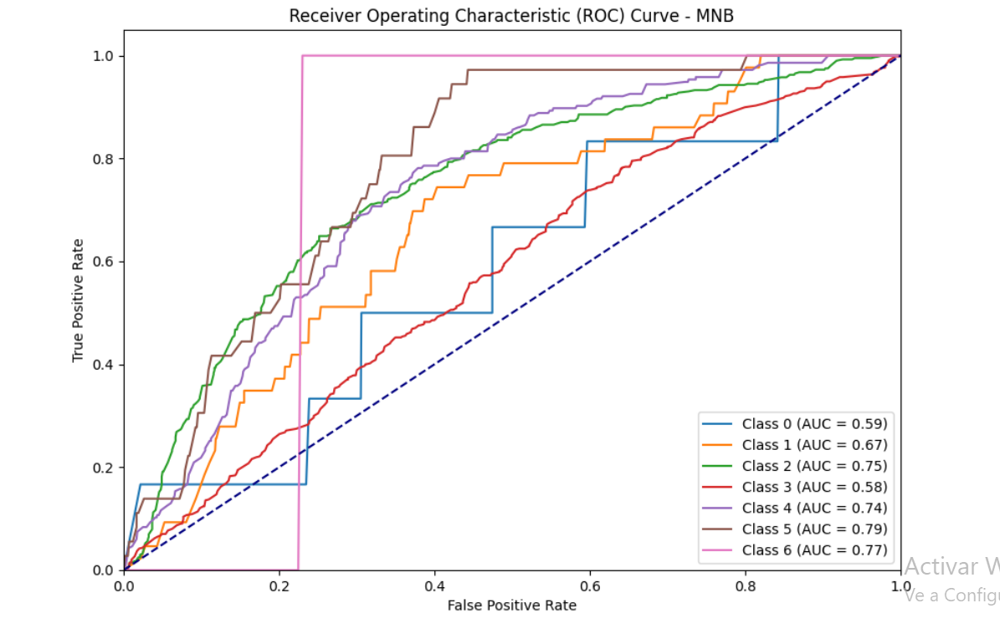<br>MNB        |
| 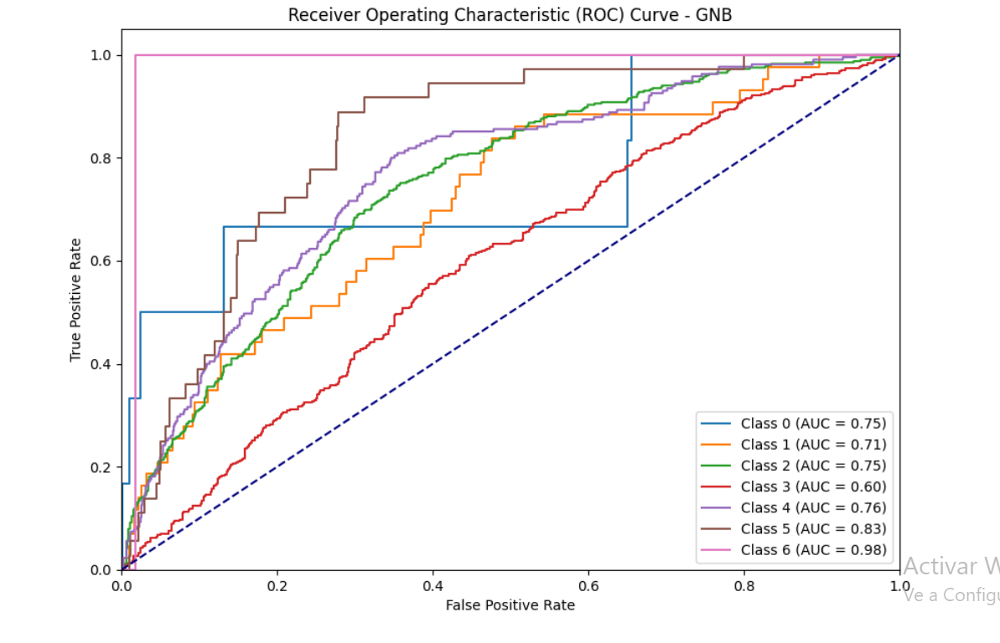<br>GNB         | 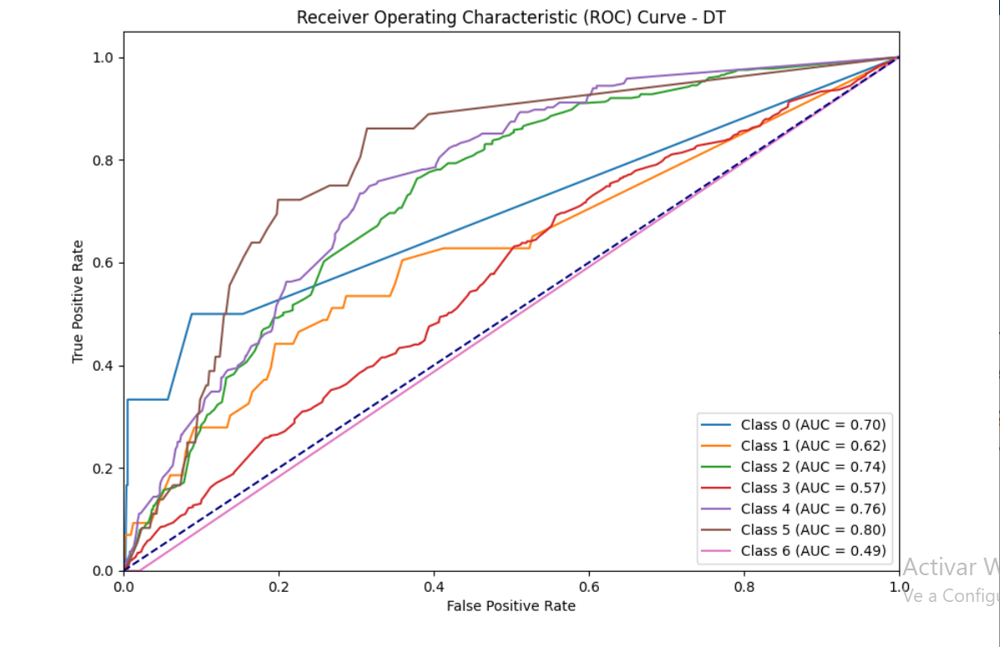<br>DT      |


Overall, almost all ROC lines are above the 0.5 threshold, which is fairly good. As we can see, classes with more instance have its line smoother in comparison to those classes with lower instances.

**NOTE**: the class 0 corresponds to number 3, class 1 correspond to number 4 and so on.
<br>

To conlude, regarding to a classification problem, we have decided to choose KNN Classifier model as the choosen one because of the high performance it has.

### Performance with discretization of the target
We are going to see whether with this approach we achieve better performance.

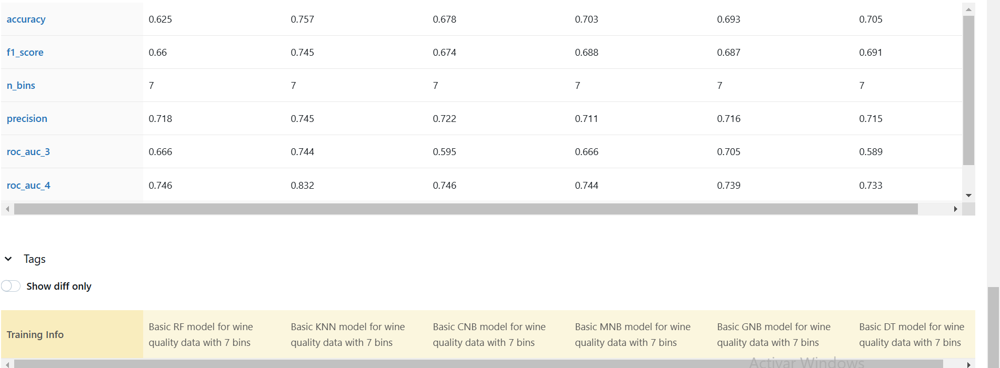

Indeed, a substantial improvement is achieved, now all models have decents accuracys and f1_scores

#### Confusion matrix

| <!-- -->      | <!-- -->        |
|:-------------:|:---------------:|
| 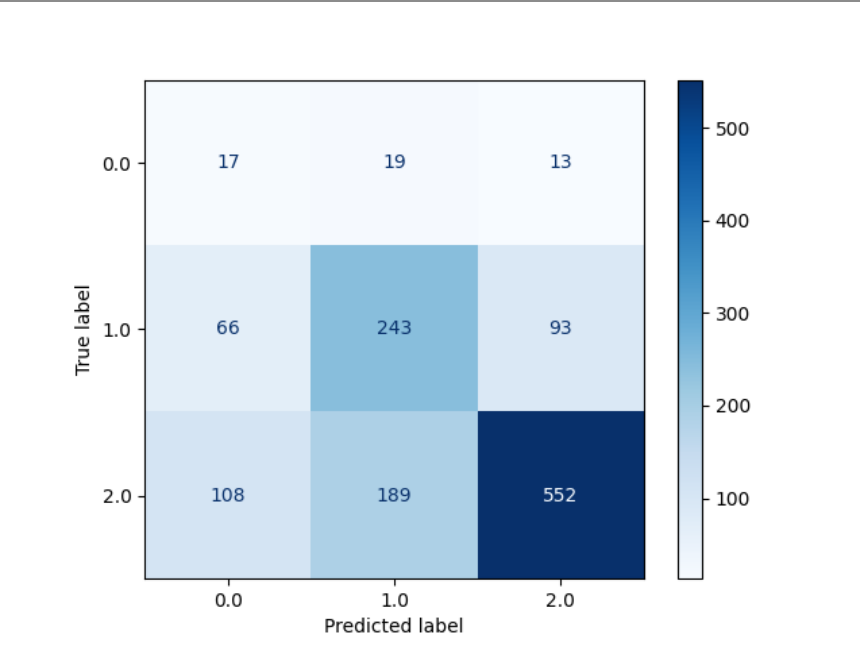<br>RF         | 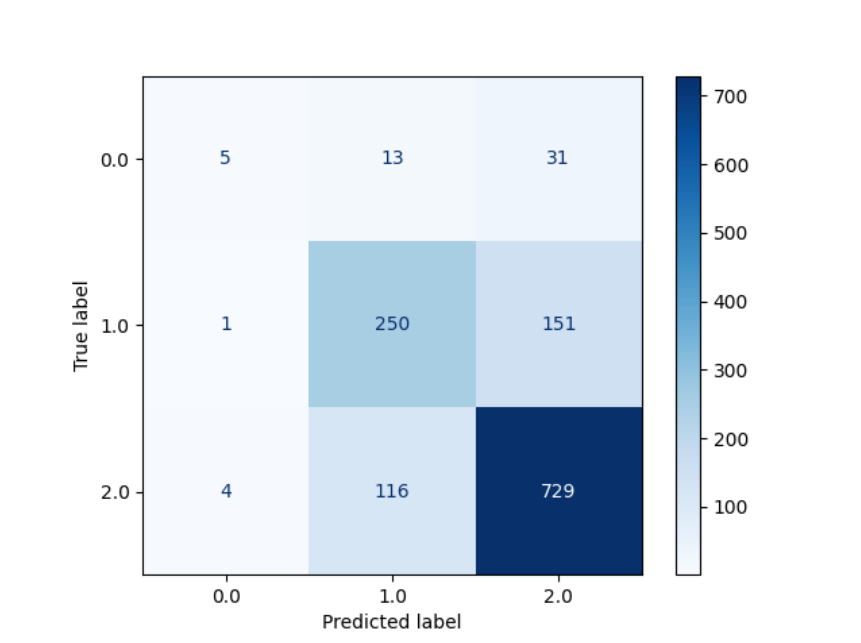<br>KNN        |
| 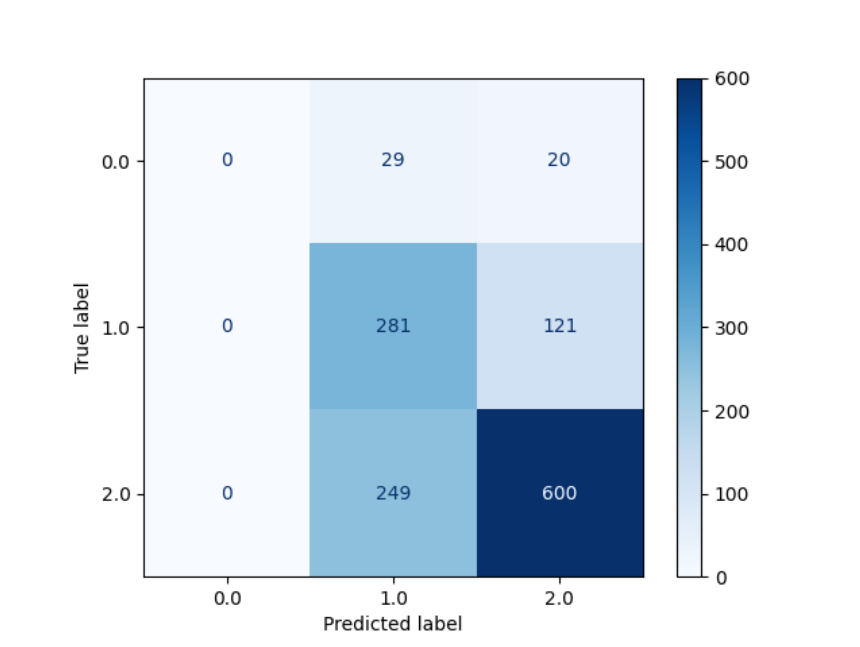<br>CNB         | 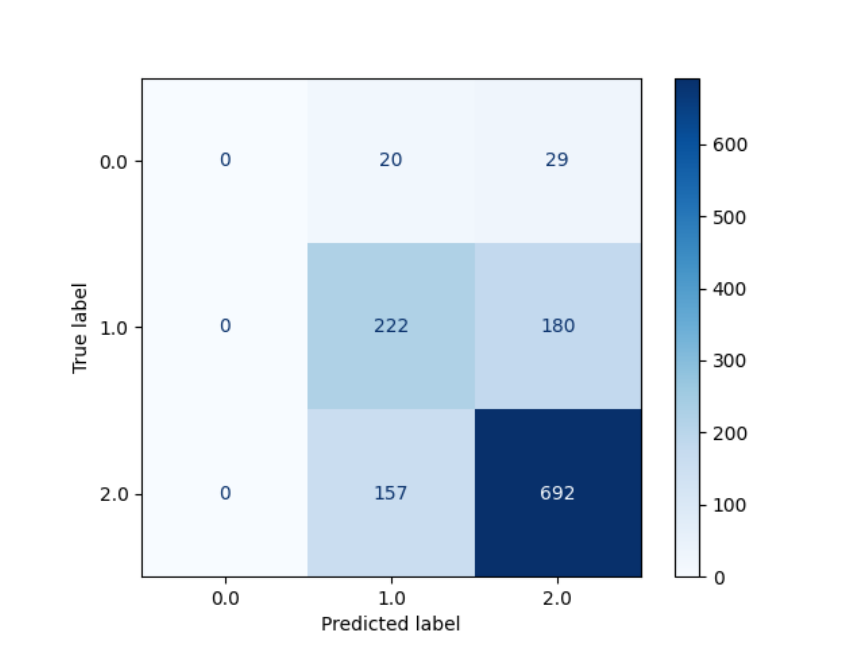<br>MNB        |
| 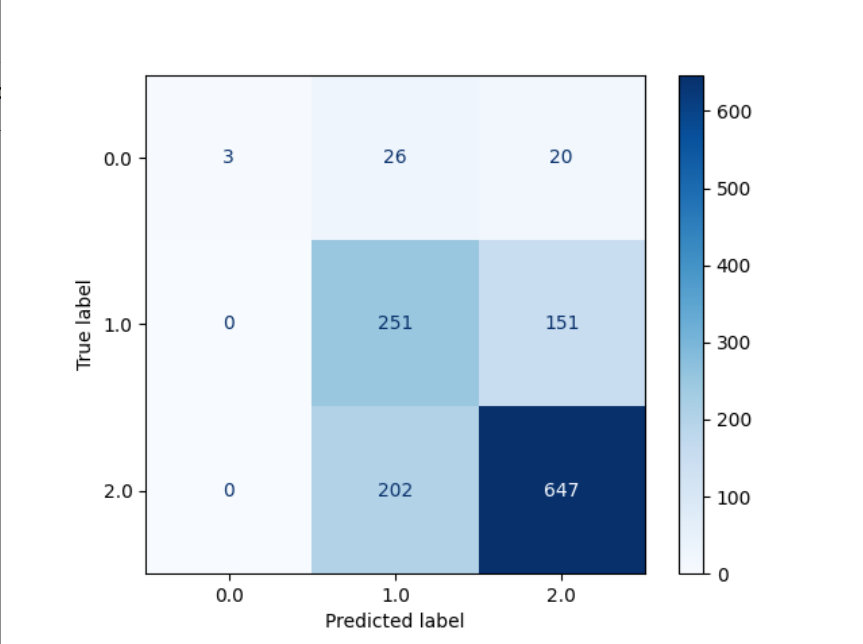<br>GNB        | 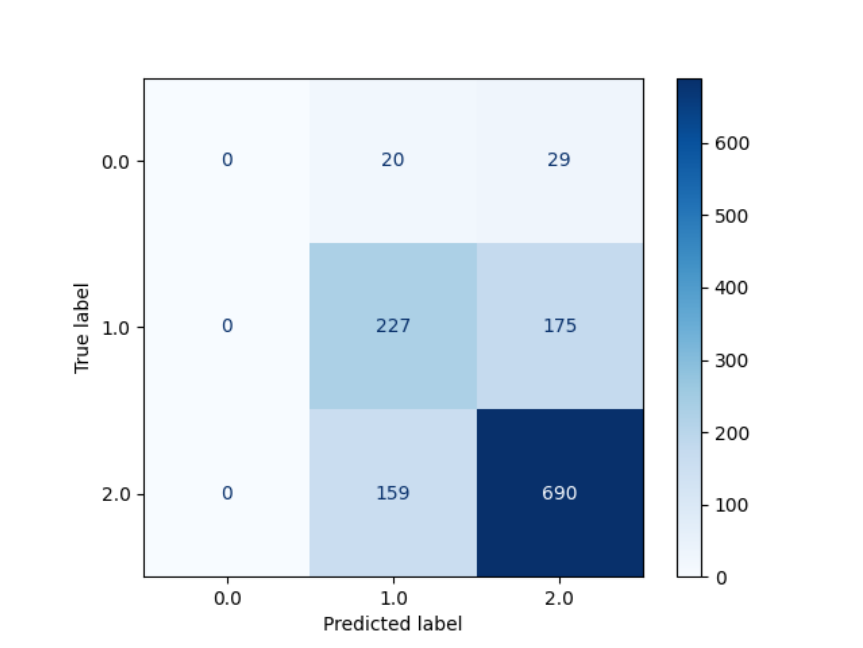<br>DT      |

#### ROC Curve

| <!-- -->      | <!-- -->        |
|:-------------:|:---------------:|
| 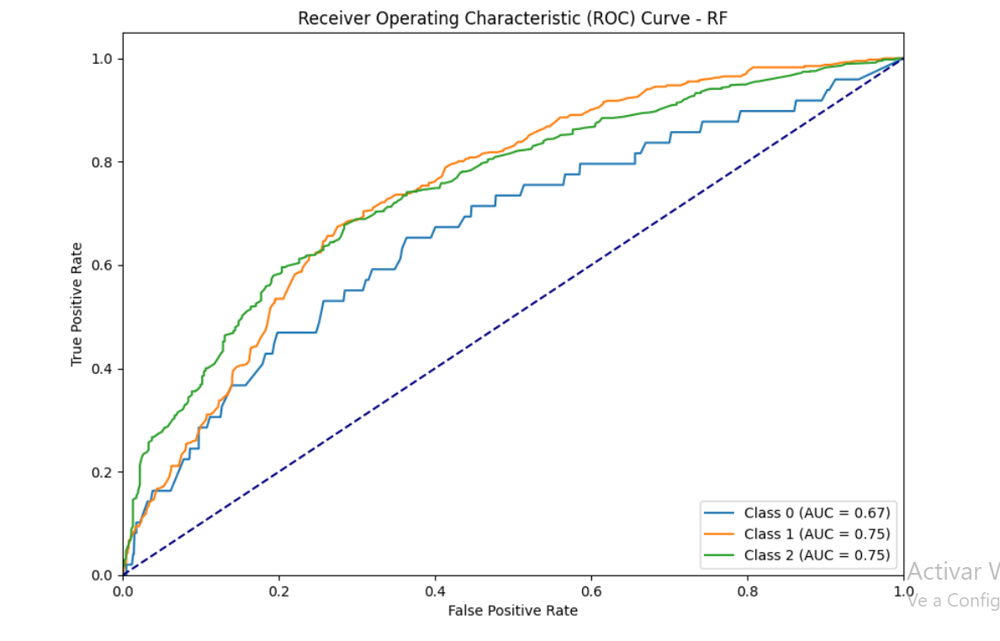<br>RF         | 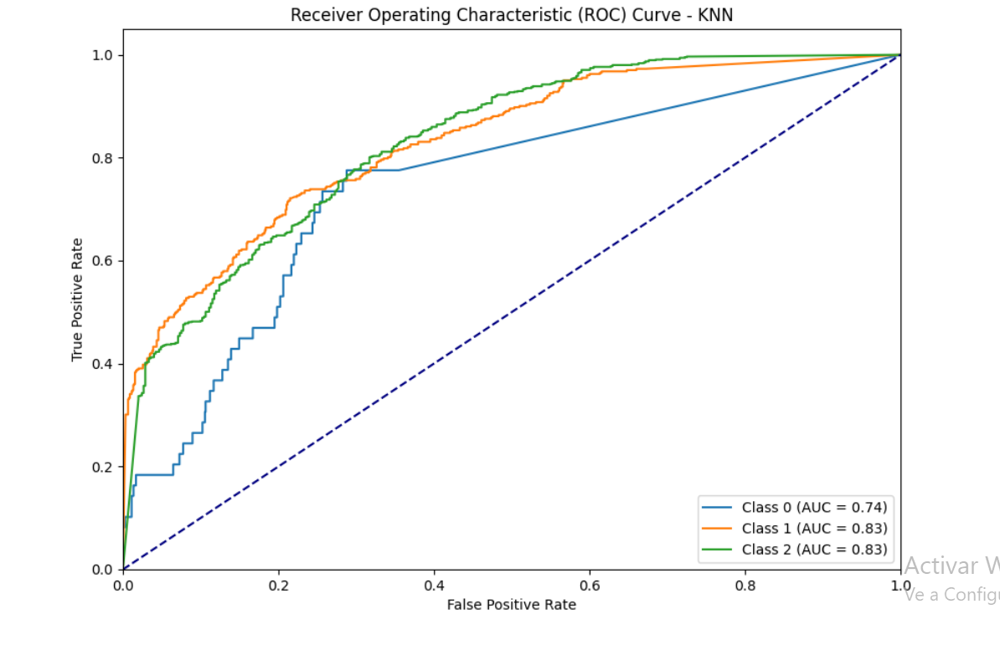<br>KNN        |
| 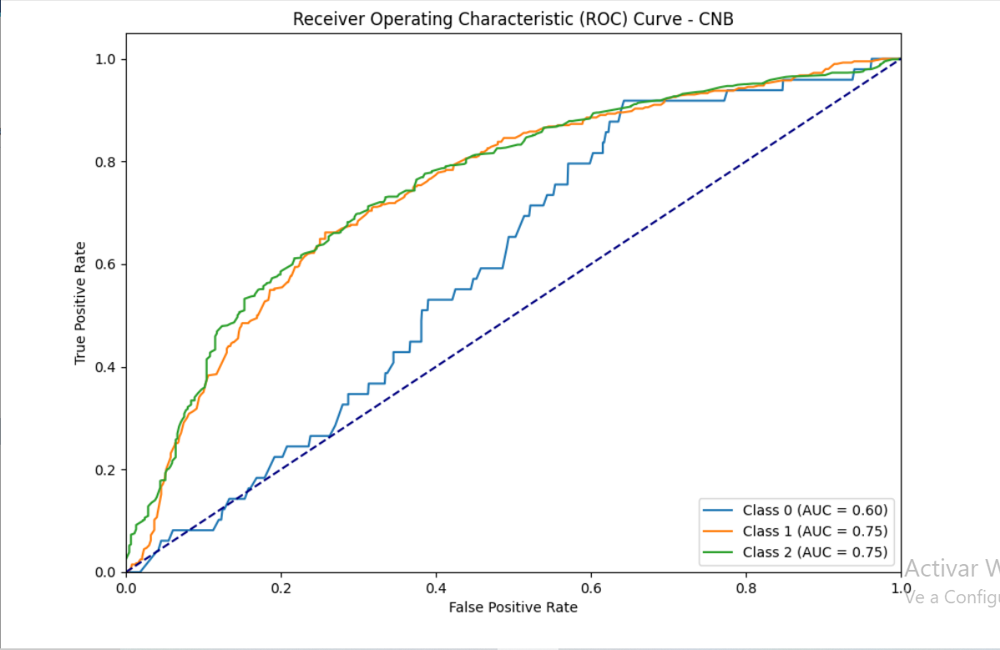<br>CNB         | 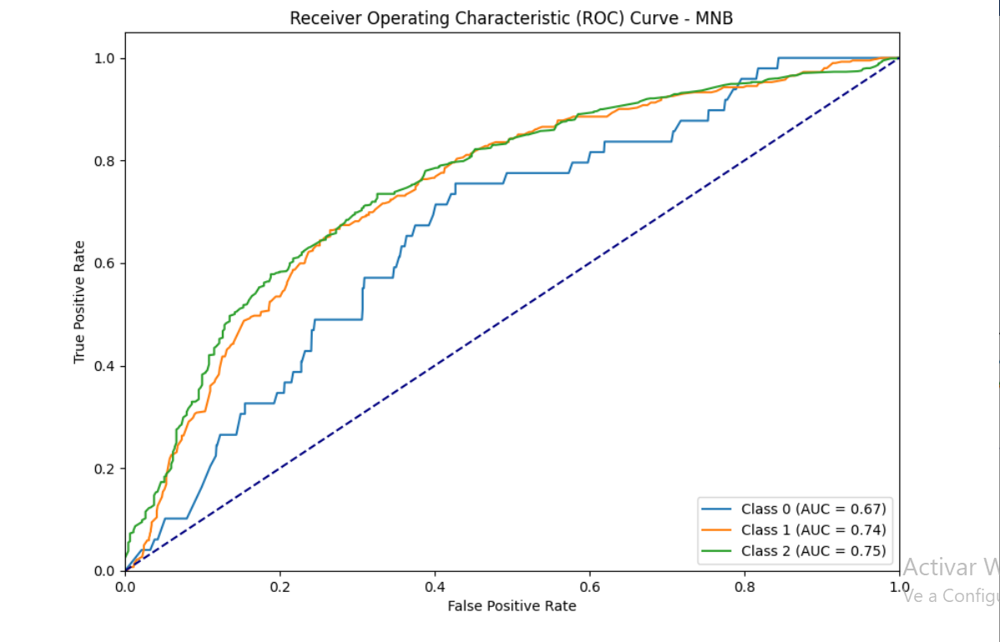<br>MNB        |
| 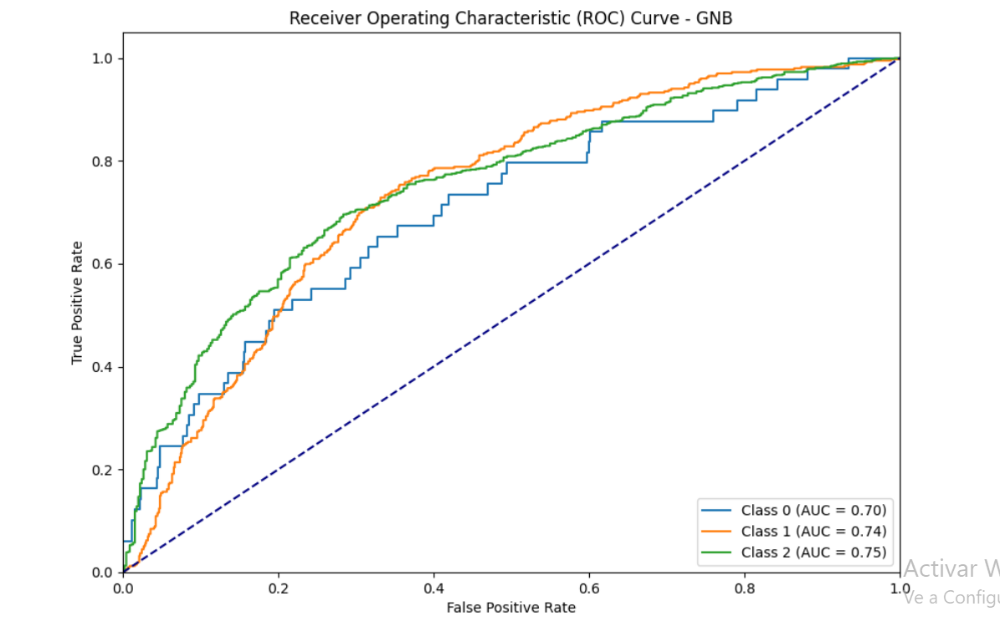<br>GNB         | 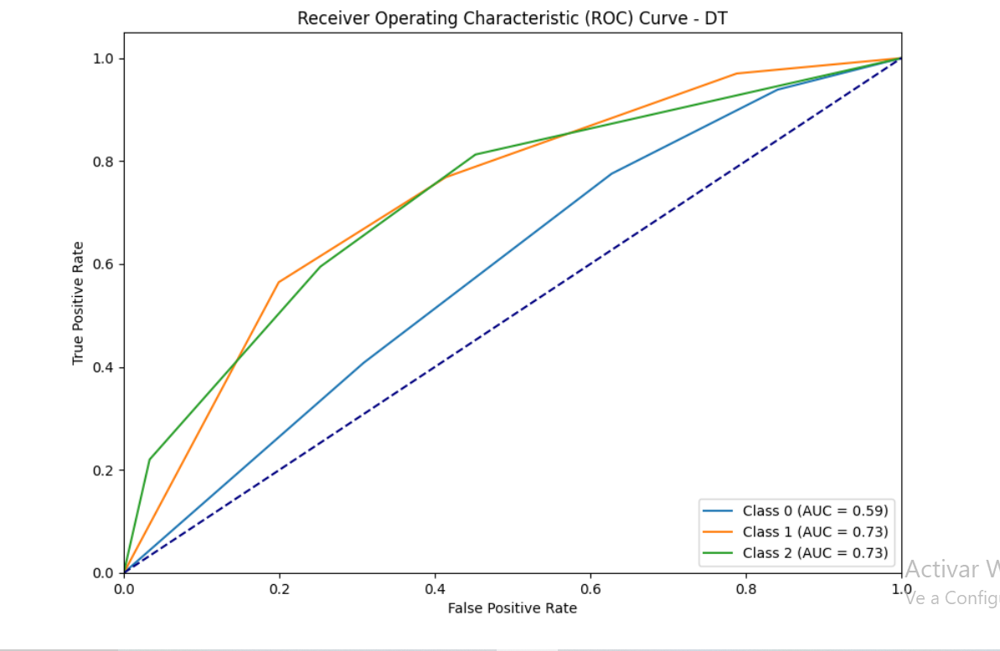<br>DT      |

### Conclusion

In conclusion, with discretization we achieve more performance in our models. This is probably because as we reduce the number of classes, the initial instancies that had low-occurence classes will probably merge with high-occurence classes, decreasing the problem of oversampling.

However, we need to take into account that some information will be lost if we group classes. In our context we have considered that this lose is worth due to the performance this approach gives. Also, we consider that we don't lose that much information because as we have a strong disbalance of classes with the initial dataset, the lesser common classes will take part with other classes into a bigger class, reducing its importance, hence we don't lose much information.

# Comparison

After selecting our models for the respective problems and seeing their performances, we can conclude that knn classification model outperforms the decission regression tree model.
<br>
This means that the classification approach tend to be better in comparison to a regression approach in this scenario. We think that classification fits better to the problem because to the nature of our variables. Wine quality (our target) could be actually treated as a continous value to predict (the aim of regression) as well as a categorical value because each calification could be transformed as a class (perfect for our classification models). How the target is distributed doesn't help at all in our model's performances, leading into low r_squared and f1_socre metrics. Indeed, the discretization process of our features have helped classification models to achieve better results in comparison to regression models, because we have limited the range of values by the discretization process, simplifying the data.
<br>

Sometimes a simplier model or with lesser complex data would be better as well as choosing those features which have more impact in our data set to improve the performance in our models as we see with the discretization of the target.